# Overview of Feature Extraction Implementation in the plot_interpretation Module of the PyTorch Forecasting Library
Dear Reviewer,

Thank you for your constructive feedback on enhancing the interpretability of our network. In response, we have prepared this notebook to explicitly demonstrate the functionality of plot_interpretation, an integral component of our STEN architecture implemented in the PyTorch Forecasting library.

Specifically, the `plot_interpretation` module was designed to provide a comprehensive visualization of the model's learning process by plotting the features extracted at each network layer. This capability allows us to dissect the network's predictions, offering insights into the contributions from different components such as trends, seasonality, and residual elements. Herein, we aim to elucidate how plot_interpretation operates and to highlight its importance in our original model submission.

In the following sections, we will delve into the specifics of plot_interpretation, showcasing how it was employed to interpret the model's internal representations and to understand its predictive decisions. We will also address how this functionality aligns with the principles of holistic forecasting, emphasizing the transparency and interpretability of the learning mechanisms within the STEN model.

We hope this demonstration will clarify any ambiguities from our initial manuscript and illustrate the inherent interpretability embedded in our network design.

In [1]:
! pip install pytorch-forecasting

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.4/140.4 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.9/91.9 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.8/155.8 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.9/801.9 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 21.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)

## Extraction implementation details


In [ ]:

from typing import Dict, List

import matplotlib.pyplot as plt
import torch
from torch import nn

from pytorch_forecasting.data import TimeSeriesDataSet
from pytorch_forecasting.data.encoders import NaNLabelEncoder
from pytorch_forecasting.metrics import MAE, MAPE, MASE, RMSE, SMAPE, MultiHorizonMetric
from pytorch_forecasting.models.base_model import BaseModel
from pytorch_forecasting.models.nbeats.sub_modules import NBEATSGenericBlock, NBEATSSeasonalBlock, NBEATSTrendBlock


class NBeats(BaseModel):

def plot_interpretation(
    self,
    x: Dict[str, torch.Tensor],
    output: Dict[str, torch.Tensor],
    idx: int,
    ax=None,
    plot_seasonality_and_generic_on_secondary_axis: bool = False,
) -> plt.Figure:
    """
    This function generates a detailed two-panel visualization that illustrates the interpretability
    of the our STEN's predictions. The first panel shows a direct comparison between the model's predictions
    and the actual values, while the second panel decomposes the forecast into its constitutive components: trend,
    seasonality, and generic influences. This dual-panel setup not only demonstrates the accuracy of the predictions
    but also visually explains the underlying factors contributing to these predictions.

    Args:
        x (Dict[str, torch.Tensor]): Input features from the batch, including both encoder and decoder data.
        output (Dict[str, torch.Tensor]): Model's output containing the backcast and forecast data.
        idx (int): Index of the sample within the batch to visualize.
        ax (List[matplotlib.axes.Axes], optional): Optional predefined Matplotlib axes for the plots.
            If not provided, a new figure is created.
        plot_seasonality_and_generic_on_secondary_axis (bool, optional): Controls whether to plot the seasonality
            and generic components on a secondary y-axis to highlight their distinct scales and impacts.

    Returns:
        plt.Figure: A matplotlib figure containing the model's predictions and their decomposition.

    """
    # Create a new figure with two subplots if no existing axes are provided.
    if ax is None:
        fig, ax = plt.subplots(2, 1, figsize=(6, 8))
    else:
        fig = ax[0].get_figure()

    # Time axis setup based on the context and prediction lengths.
    time = torch.arange(-self.hparams.context_length, self.hparams.prediction_length)

    # First Panel: plotting the actual targets against the model's combined predictions.
    ax[0].plot(time, torch.cat([x["encoder_target"][idx], x["decoder_target"][idx]]).detach().cpu(), label="target")
    ax[0].plot(
        time,
        torch.cat([output["backcast"][idx].detach(), output["prediction"][idx].detach()], dim=0).cpu(),
        label="prediction",
    )
    ax[0].set_xlabel("Time")

    # Second Panel: decomposing the prediction into its individual components.
    prop_cycle = iter(plt.rcParams["axes.prop_cycle"])
    next(prop_cycle)  # Skip colors used for the target and prediction.
    next(prop_cycle)

    # Optionally use a secondary axis for certain components to emphasize their unique contributions.
    if plot_seasonality_and_generic_on_secondary_axis:
        ax2 = ax[1].twinx()
        ax2.set_ylabel("Seasonality / Generic")
    else:
        ax2 = ax[1]

    # Iteratively plot each component, adjusting properties based on the stack type.
    for title in ["trend", "seasonality", "generic"]:
        if title not in self.hparams.stack_types:
            continue
        if title == "trend":
            ax[1].plot(
                time,
                output[title][idx].detach().cpu(),
                label=title.capitalize(),
                c=next(prop_cycle)["color"],
            )
        else:
            ax2.plot(
                time,
                output[title][idx].detach().cpu(),
                label=title.capitalize(),
                c=next(prop_cycle)["color"],
            )

    # Label configuration for clarity and comprehension.
    ax[1].set_xlabel("Time")
    ax[1].set_ylabel("Decomposition")

    # Include a legend to identify all plotted elements.
    fig.legend()

    # Return the fully annotated figure.
    return fig


# Demonstration on Synthetic Data: Variability in Model Performance Across Diverse Cyclical-Trend Scenarios

In [52]:
import os
import warnings

warnings.filterwarnings("ignore")

os.chdir("../../..")

In [64]:
import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping
import pandas as pd
import torch

from pytorch_forecasting import Baseline, NBeats, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE

In [65]:
def generate_data(
    n_series: int = 10,
    timesteps: int = 400,
    seasonality: float = 3.0,
    trend: float = 3.0,
    noise: float = 0.1,
    level: float = 1.0,
    exp: bool = False,
    seed: int = 213,
) -> pd.DataFrame:
    """
    Generate multivariate data without covariates.

    Eeach timeseries is generated from seasonality and trend. Important columns:

    * ``series``: series ID
    * ``time_idx``: time index
    * ``value``: target value

    Args:
        n_series (int, optional): Number of series. Defaults to 10.
        timesteps (int, optional): Number of timesteps. Defaults to 400.
        seasonality (float, optional): Normalized frequency, i.e. frequency is ``seasonality / timesteps``.
            Defaults to 3.0.
        trend (float, optional): Trend multiplier (seasonality is multiplied with 1.0). Defaults to 3.0.
        noise (float, optional): Level of gaussian noise. Defaults to 0.1.
        level (float, optional): Level multiplier (level is a constant to be aded to timeseries). Defaults to 1.0.
        exp (bool, optional): If to return exponential of timeseries values. Defaults to False.
        seed (int, optional): Random seed. Defaults to 213.

    Returns:
        pd.DataFrame: data
    """
    # sample parameters
    np.random.seed(seed)
    linear_trends = np.random.normal(size=n_series)[:, None] / timesteps
    quadratic_trends = np.random.normal(size=n_series)[:, None] / timesteps**2
    seasonalities = np.random.normal(size=n_series)[:, None]
    levels = level * np.random.normal(size=n_series)[:, None]

    # generate series
    x = np.arange(timesteps)[None, :]
    series = (x * linear_trends + x**2 * quadratic_trends) * trend + seasonalities * np.sin(
        2 * np.pi * seasonality * x / timesteps
    )
    # add noise
    series = levels * series * (1 + noise * np.random.normal(size=series.shape))
    if exp:
        series = np.exp(series)

    # insert into dataframe
    data = (
        pd.DataFrame(series)
        .stack()
        .reset_index()
        .rename(columns={"level_0": "series", "level_1": "time_idx", 0: "value"})
    )

    return data

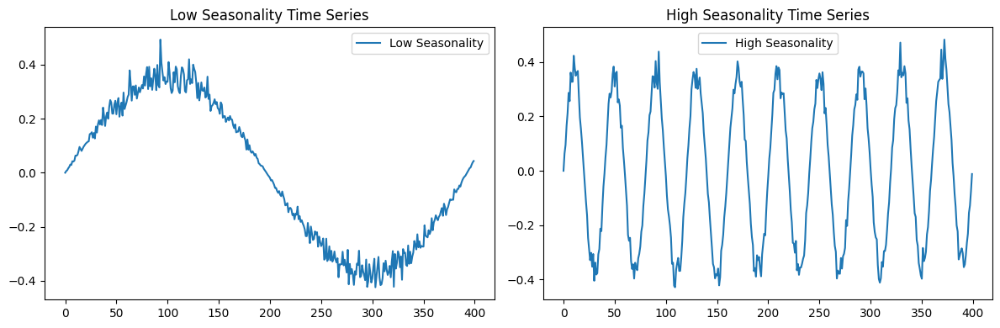

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Generate synthetic data sets with differing degrees of seasonality
# Lower seasonality implies longer periods between cycles
data_low_seasonality = generate_data(seasonality=1.0)

# Higher seasonality implies more frequent cycles within the same timeframe
data_high_seasonality = generate_data(seasonality=10.0)

# Initialize a plot with specified dimensions
plt.figure(figsize=(12, 4))

# Plotting the low seasonality data
plt.subplot(1, 2, 1)  # Defines a subplot in a 1x2 grid (first position)
plt.plot(data_low_seasonality[data_low_seasonality['series'] == 0]['value'], label='Low Seasonality')
plt.title('Low Seasonality Time Series')  # Title for the subplot
plt.legend()  # Adds a legend to the subplot

# Plotting the high seasonality data
plt.subplot(1, 2, 2)  # Defines a subplot in a 1x2 grid (second position)
plt.plot(data_high_seasonality[data_high_seasonality['series'] == 0]['value'], label='High Seasonality')
plt.title('High Seasonality Time Series')  # Title for the subplot
plt.legend()  # Adds a legend to the subplot

plt.tight_layout()  # Adjusts subplot params so that the plots fit into the figure area.
plt.show()  # Display the figure with the plots



In [76]:
data = generate_data(seasonality=10.0, timesteps=400, n_series=100, seed=42)
data["static"] = 2
data["date"] = pd.Timestamp("2024-01-01") + pd.to_timedelta(data.time_idx, "D")
data.head()

,series,time_idx,value,static,date
0,0,0,-0.000000,2,2024-01-01
1,0,1,-0.046501,2,2024-01-02
2,0,2,-0.097796,2,2024-01-03
3,0,3,-0.144397,2,2024-01-04
4,0,4,-0.177954,2,2024-01-05


<Axes: xlabel='time_idx', ylabel='value'>

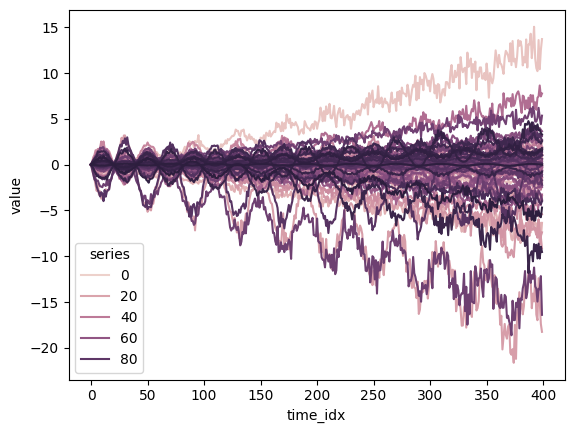

In [77]:
import seaborn as sns
df_plot = data.set_index('date')
sns.lineplot(data=df_plot,x='time_idx',y='value',hue='series')

In [78]:
# create dataset and dataloaders
max_encoder_length = 60
max_prediction_length = 20

training_cutoff = data["time_idx"].max() - max_prediction_length

context_length = max_encoder_length
prediction_length = max_prediction_length

training = TimeSeriesDataSet(
    data[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="value",
    categorical_encoders={"series": NaNLabelEncoder().fit(data.series)},
    group_ids=["series"],
    # only unknown variable is "value" - and N-Beats can also not take any additional variables
    time_varying_unknown_reals=["value"],
    max_encoder_length=context_length,
    max_prediction_length=prediction_length,
)

validation = TimeSeriesDataSet.from_dataset(training, data, min_prediction_idx=training_cutoff + 1)
batch_size = 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

In [79]:
# calculate baseline absolute error
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
SMAPE()(baseline_predictions.cpu(), actuals)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


tensor(0.5462)

In [80]:
pl.seed_everything(42)
trainer = pl.Trainer(accelerator="auto", gradient_clip_val=0.01)
net = NBeats.from_dataset(training, learning_rate=3e-2, weight_decay=1e-2, widths=[32, 512], backcast_loss_ratio=0.1)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.004466835921509632
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.004466835921509632
INFO: Restoring states from the checkpoint path at /.lr_find_7b35049f-61c9-49b7-973b-9eb52a33e8d3.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /.lr_find_7b35049f-61c9-49b7-973b-9eb52a33e8d3.ckpt
INFO: Restored all states from the checkpoint at /.lr_find_7b35049f-61c9-49b7-973b-9eb52a33e8d3.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint at /.lr_find_7b35049f-61c9-49b7-973b-9eb52a33e8d3.ckpt


suggested learning rate: 0.004466835921509632


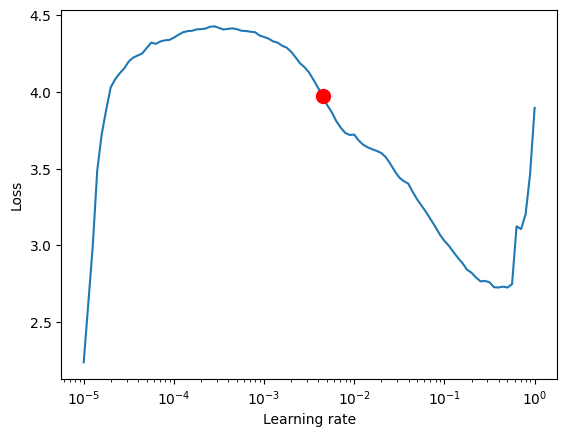

In [81]:
# find optimal learning rate
from lightning.pytorch.tuner import Tuner

res = Tuner(trainer).lr_find(net, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5)
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = res.suggestion()

In [82]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
trainer = pl.Trainer(
    max_epochs=3,
    accelerator="auto",
    enable_model_summary=True,
    gradient_clip_val=0.01,
    callbacks=[early_stop_callback],
    limit_train_batches=150,
)


net = NBeats.from_dataset(
    training,
    learning_rate=1e-3,
    log_interval=10,
    log_val_interval=1,
    weight_decay=1e-2,
    backcast_loss_ratio=1.0,
)

trainer.fit(
    net,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.7 M 
-----------------------------------------------
1.7 M     Trainable params
0         Non-trainable params
1.7 M     Total params
6.851     Total e

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=3` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [83]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = NBeats.load_from_checkpoint(best_model_path)

In [84]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_model.predict(val_dataloader)
(actuals - predictions.cpu()).abs().mean()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


tensor(0.1849)

In [85]:
raw_predictions = best_model.predict(val_dataloader, mode="raw", return_x=True)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


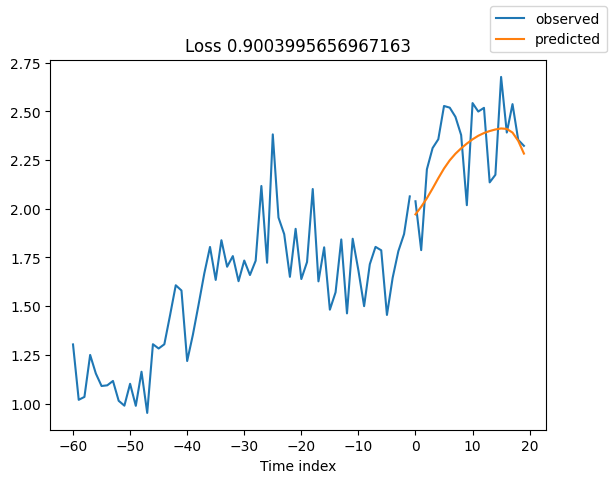

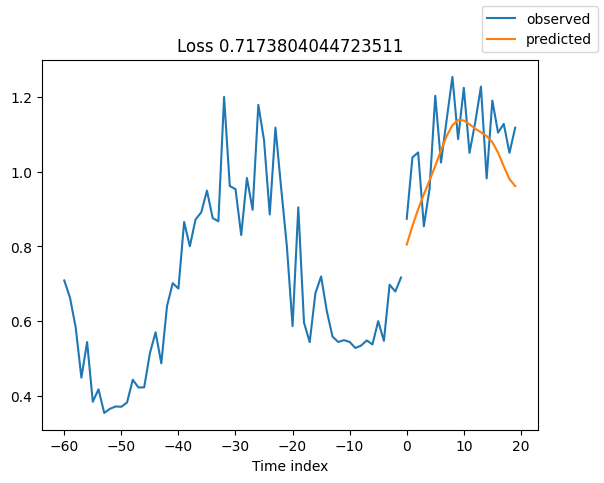

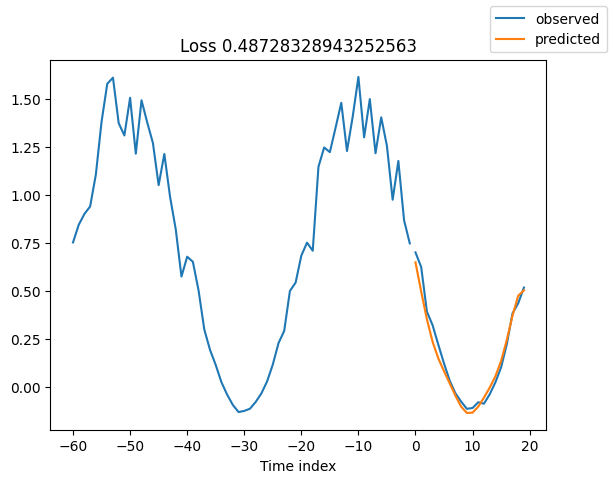

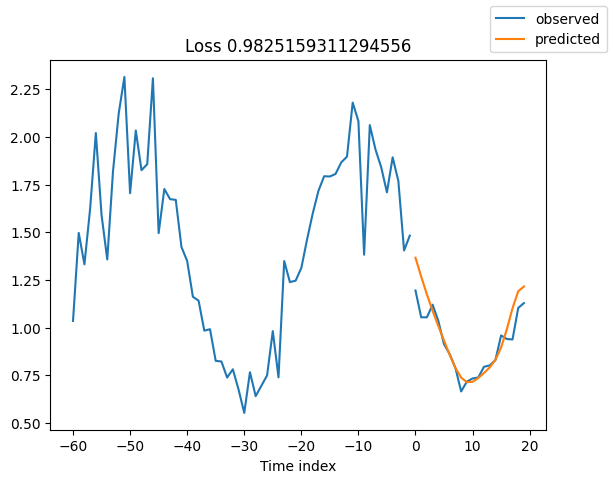

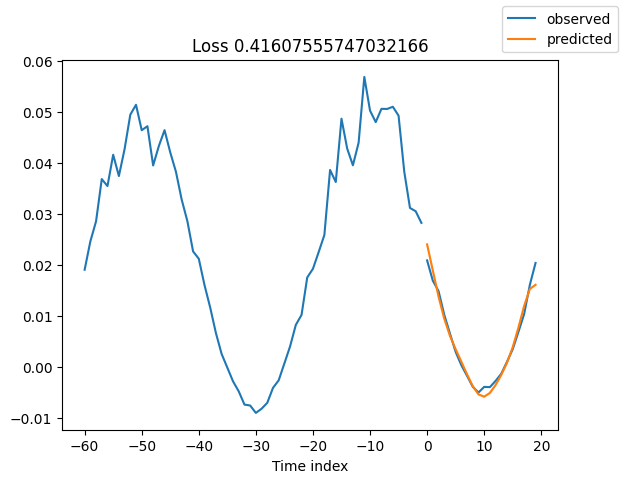

...

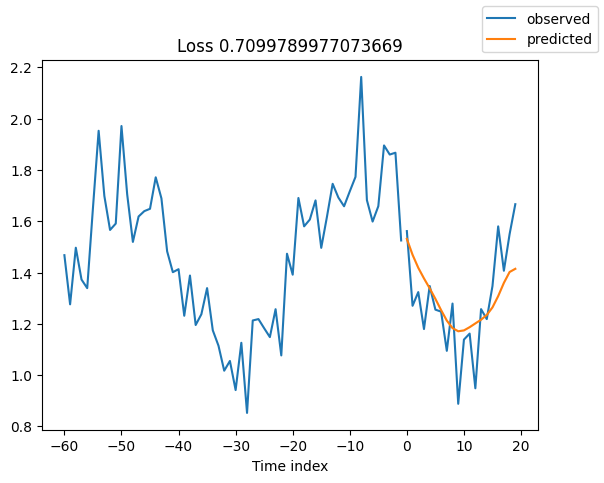

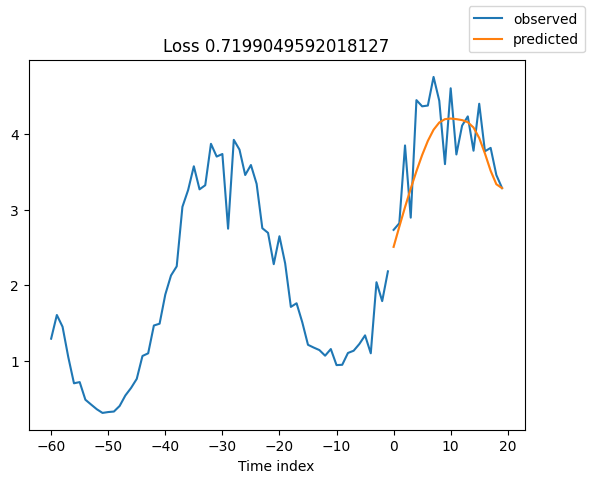

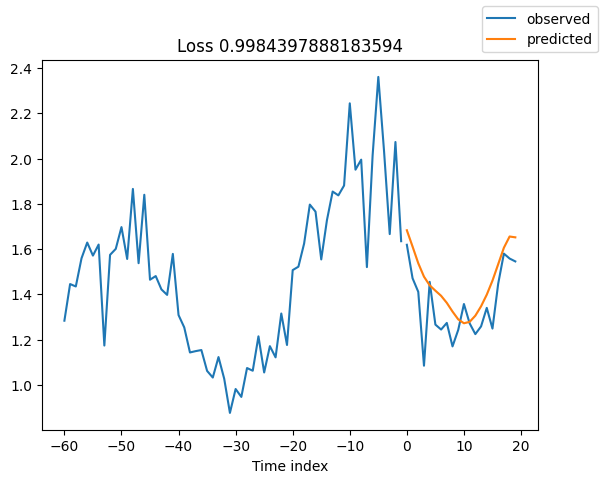

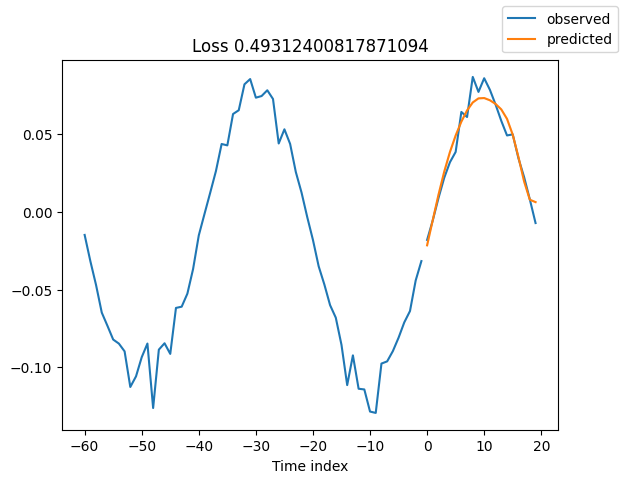

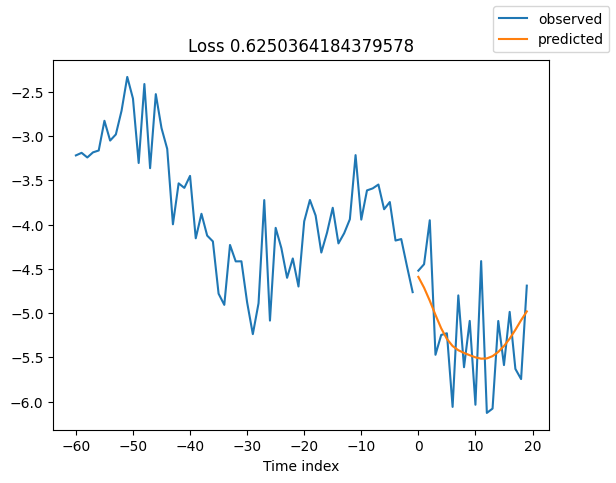

In [88]:
for idx in range(100):  # plot 10 examples
    best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)

From the results observed, it appears that the proposed network excels at capturing more pronounced cyclical patterns, yet it may exhibit limitations in effectively handling minor fluctuations under default settings.

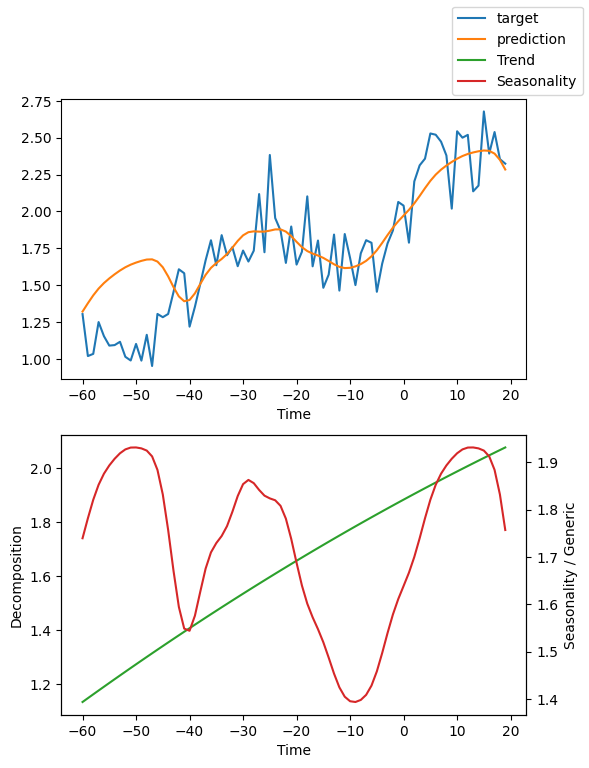

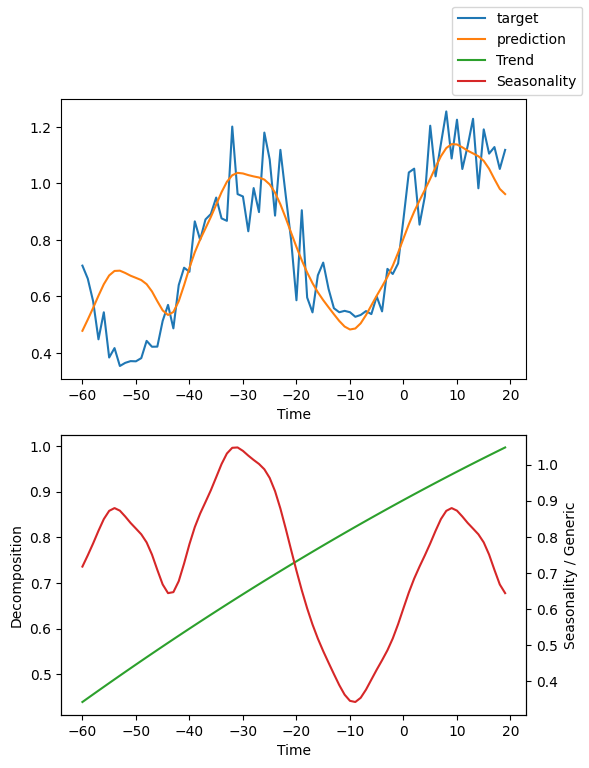

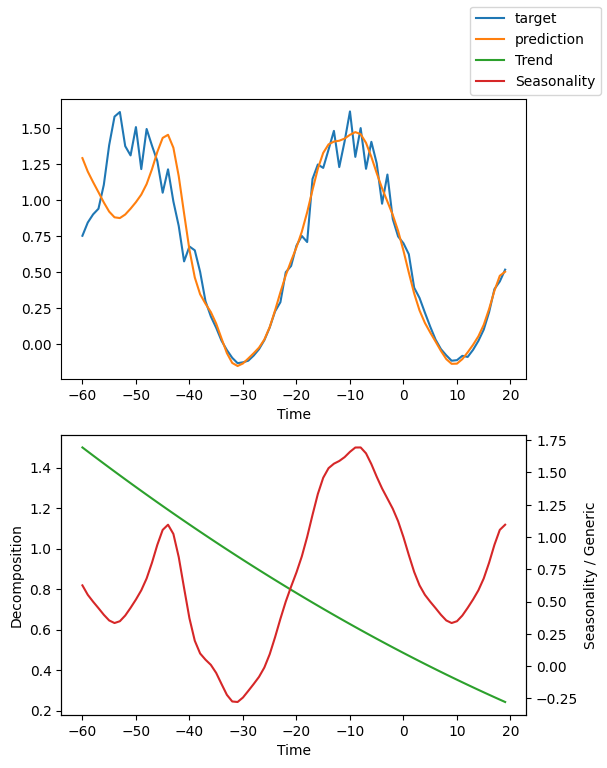

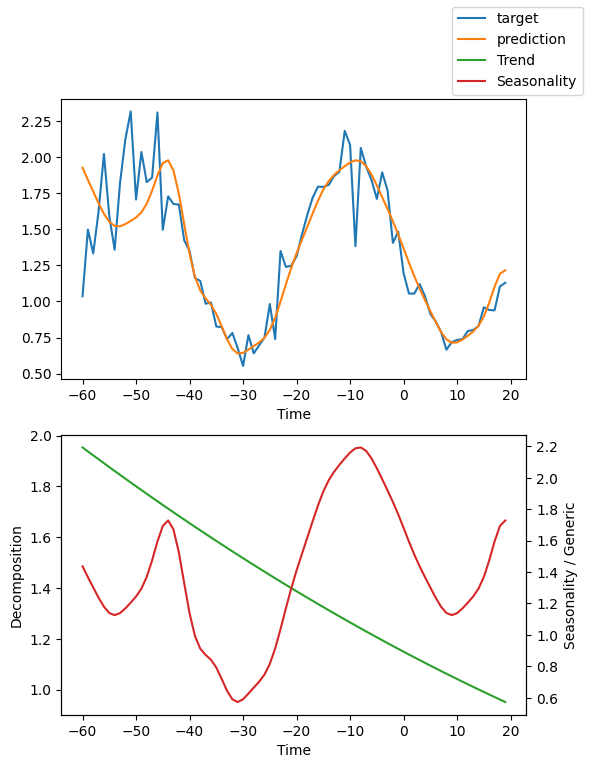

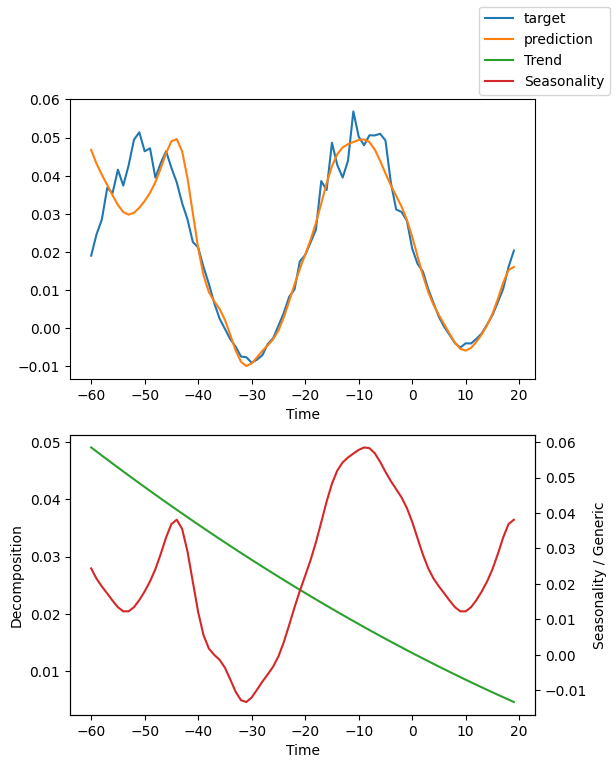

...

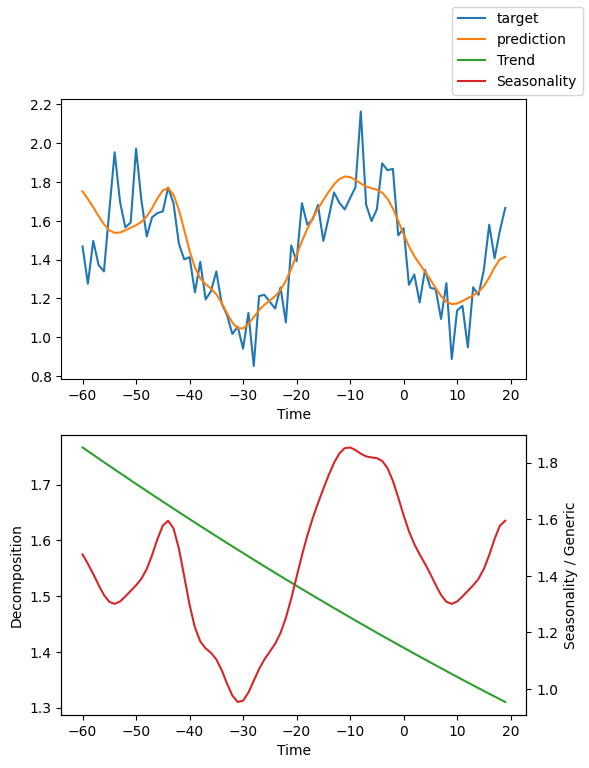

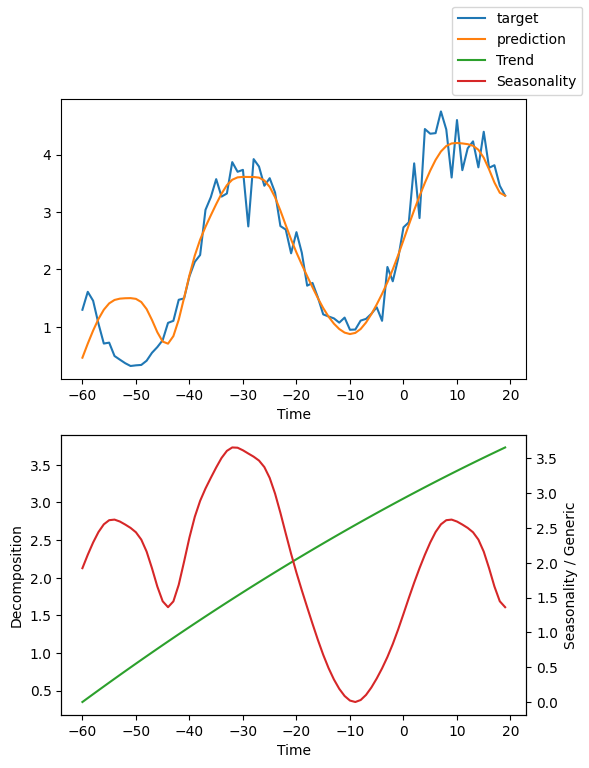

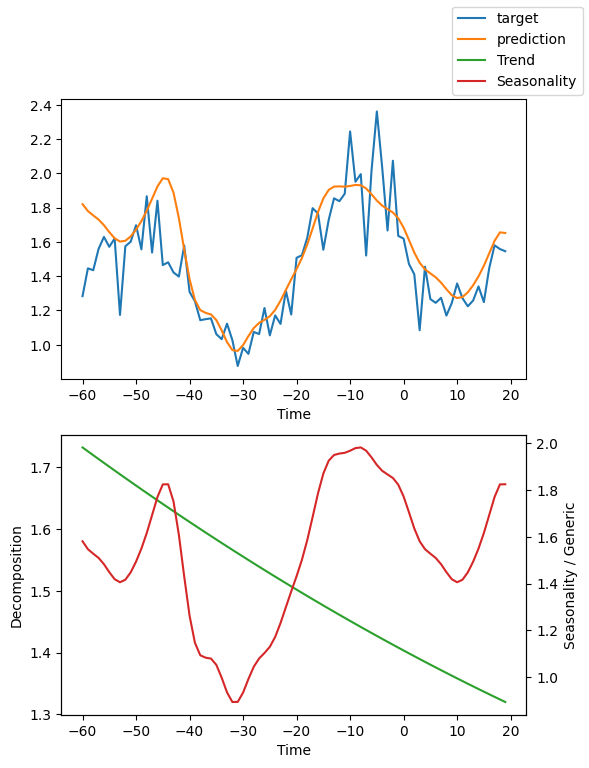

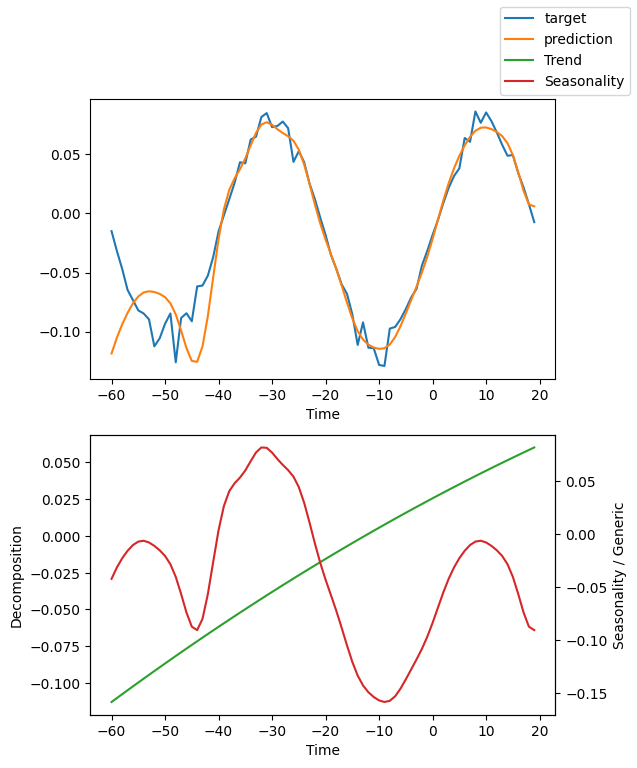

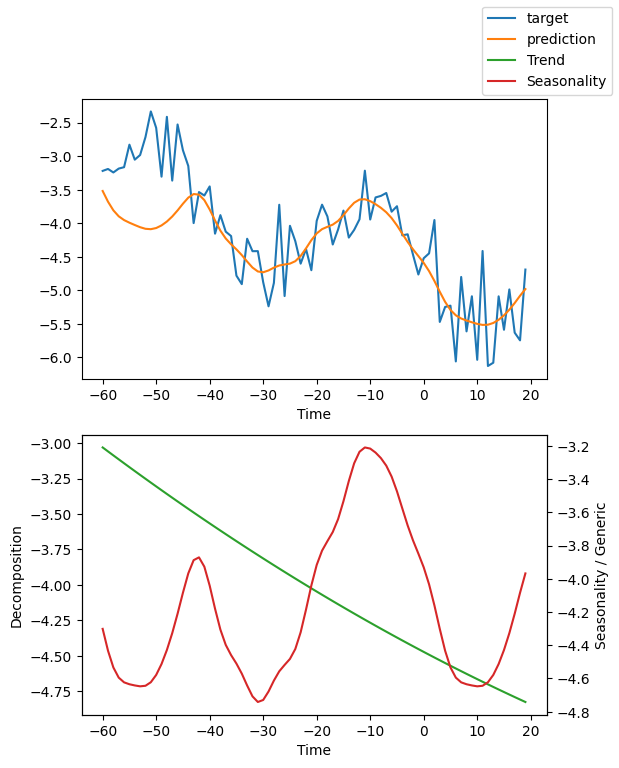

In [89]:
for idx in range(100):  # plot 10 examples
    best_model.plot_interpretation(raw_predictions.x, raw_predictions.output, idx=idx,plot_seasonality_and_generic_on_secondary_axis=True)

Upon examination of the extracted features—specifically the delineated seasonal and trend components—it becomes evident that the model exhibits a notable proficiency in discerning the underlying trend within the time series. The trend line captures the overarching trajectory of the data, suggesting a robust capacity for identifying long-term directional movements. Meanwhile, the seasonal component reflects the model's attempt to encapsulate recurring patterns, although it appears to grapple with the intricacies of finer oscillations. This interplay between trend and seasonality underscores the model's potential in parsing substantial periodic forces while highlighting areas for enhancement, particularly in the granularity of cyclical fluctuations.